In [1]:
!pip install -qq  ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5933.9/8062.4 GB disk)


In [3]:
from ultralytics import YOLO
from IPython.display import display, Image
# YOLO('yolov8n.pt')  # Load a YOLOv8 model (n: nano, for testing purposes)

In [4]:
pip install -U albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.8/225.8 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.4/291.4 kB 16.7 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.17
    Uninstalling albucore-0.0.17:
      Successfully uninstalled albucore-0.0.17
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.17
    Uninstalling albumentations-1.4.17:
      Successfully uninstalled albumentations-1.4.17
Note: you may need to restart the kernel to use updated packages.


In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data=/kaggle/input/yolo-uav-yaml/data.yaml epochs=30 imgsz=512 plots=True

/opt/conda/lib/python3.10/site-packages/ultralytics/nn/tasks.py:332: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location='cpu')  # load
Ultral

In [7]:
!yolo task=detect mode=val model=/kaggle/working/runs/detect/train2/weights/best.pt data=/kaggle/input/yolo-uav-yaml/data.yaml

/opt/conda/lib/python3.10/site-packages/ultralytics/nn/tasks.py:332: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location='cpu')  # load
Ultral

In [8]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train2/weights/best.pt conf=0.25 source=/kaggle/input/merged-yolo-uav-data/test/images save=True save_txt=True save_conf=True

/opt/conda/lib/python3.10/site-packages/ultralytics/nn/tasks.py:332: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location='cpu')  # load
Ultral

In [9]:
import shutil

# Specify the path where the best model is saved
trained_model_path = "/kaggle/working/runs/detect/train/weights/best.pt"

# Define the destination path
destination_path = "/kaggle/working/yolov8_trained_model.pt"

# Copy the trained model to the destination path
shutil.copy(trained_model_path, destination_path)
print("Model saved as yolov8_trained_model.pt.")


Model saved as yolov8_trained_model.pt.


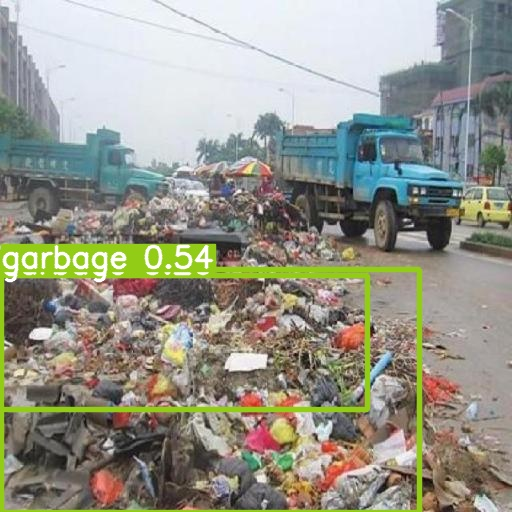

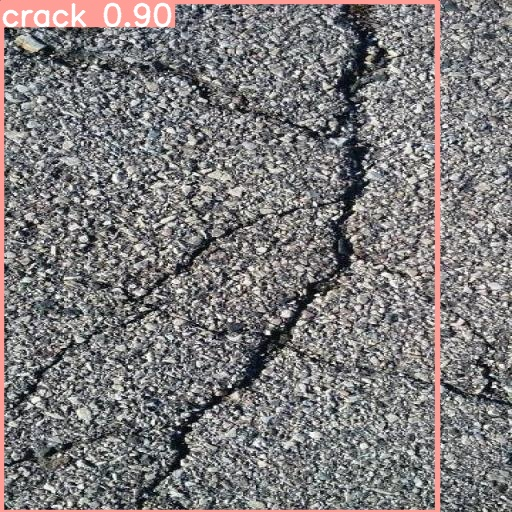

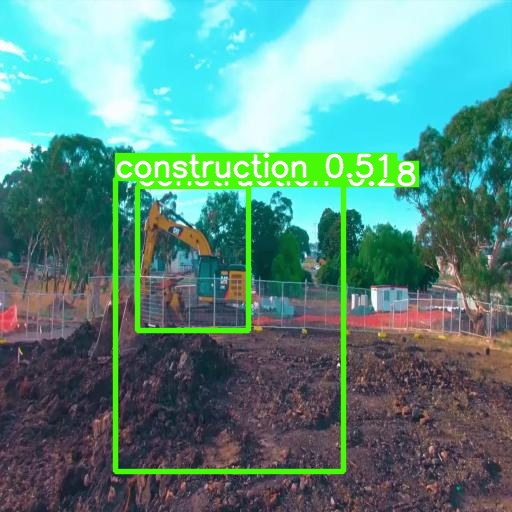

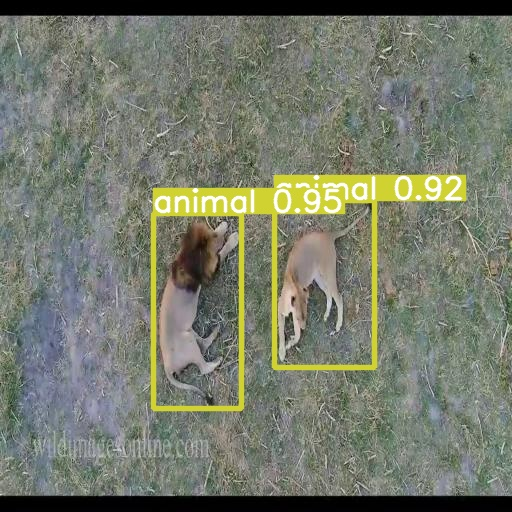

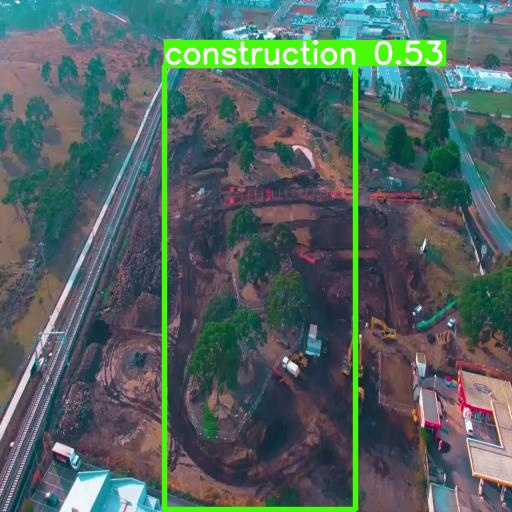

...

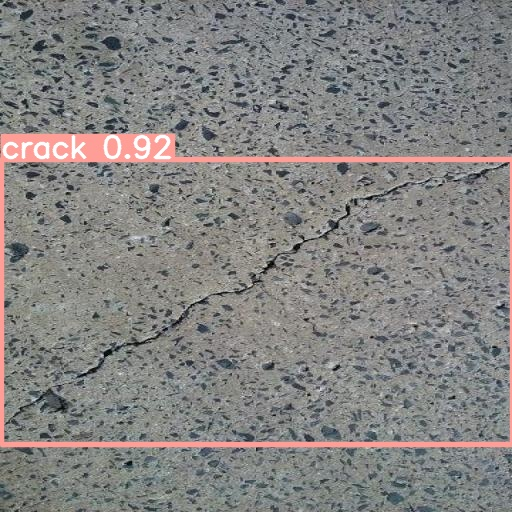

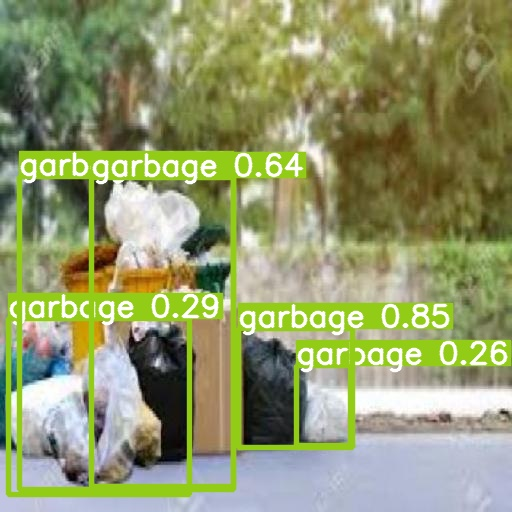

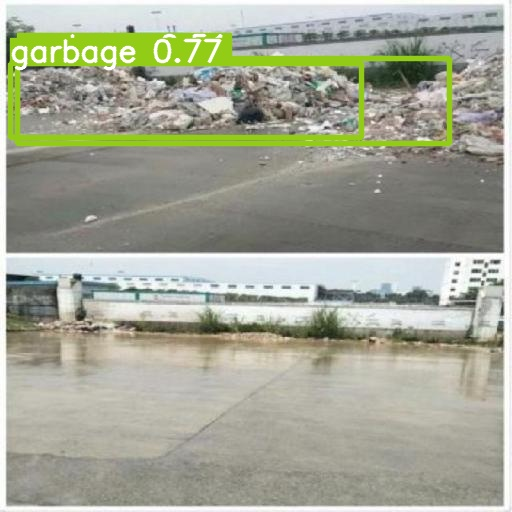

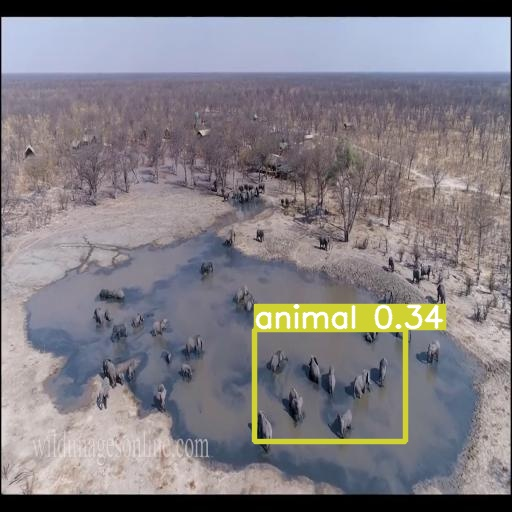

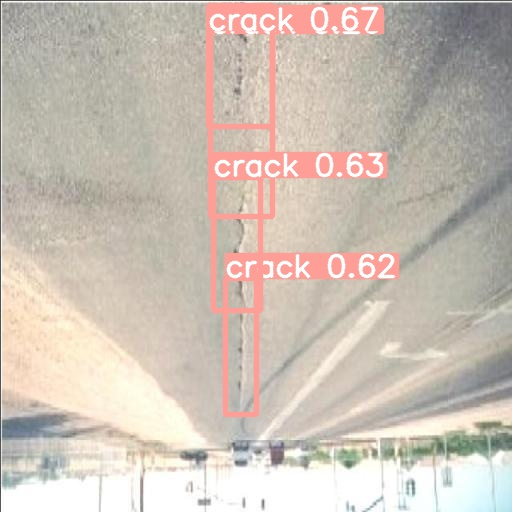

In [12]:
import glob
import random
from IPython.display import Image, display

# Get a list of all image paths in the prediction directory
image_paths = glob.glob('runs/detect/predict/*.jpg')

# Shuffle the list of image paths
random.shuffle(image_paths)

# Display the first 10 shuffled images
for image_path in image_paths[:20]:
    display(Image(filename=image_path, width=600))
    print("\n")


In [37]:
import glob
import os
import pandas as pd

# Define the mapping of class numbers to label names
class_mapping = {
    '0': '-',
    '1': 'crack',
    '2': 'crash',
    '3': 'pothole',
    '4': 'animal',
    '5': 'construction',
    '6': 'garbage'
    # Add more mappings as needed
}

# Directory paths for images and labels
label_paths = glob.glob('runs/detect/predict/labels/*.txt')

# Initialize an empty list to store image names and their classified labels
data = []

# Loop through each label file and extract image name and classified label
for label_path in label_paths:
    # Get the full image name from the label file name (keeping the original extension)
    image_name = os.path.basename(label_path).replace('.txt', '.jpg')  # Ensure the image extension is .jpg
    
    # Read the label content and extract the class
    with open(label_path, 'r') as file:
        for line in file:
            class_number = line.split()[0]  # Assuming class label is the first entry in each line
            class_label = class_mapping.get(class_number, "Unknown")  # Map class number to label name
            data.append([image_name, class_label])

# Create a DataFrame from the collected data
df = pd.DataFrame(data, columns=['Image Name', 'Classified Label'])

# Save the DataFrame to a CSV file
output_csv_path = 'predicted_labels_with_names.csv'
df.to_csv(output_csv_path, index=False)

print(f"Predicted labels with names saved to {output_csv_path}")


Predicted labels with names saved to predicted_labels_with_names.csv


Class Label for construction6_0090_jpg.rf.bcda7707693d3ed0a7f0e7be67785c40.jpg: construction


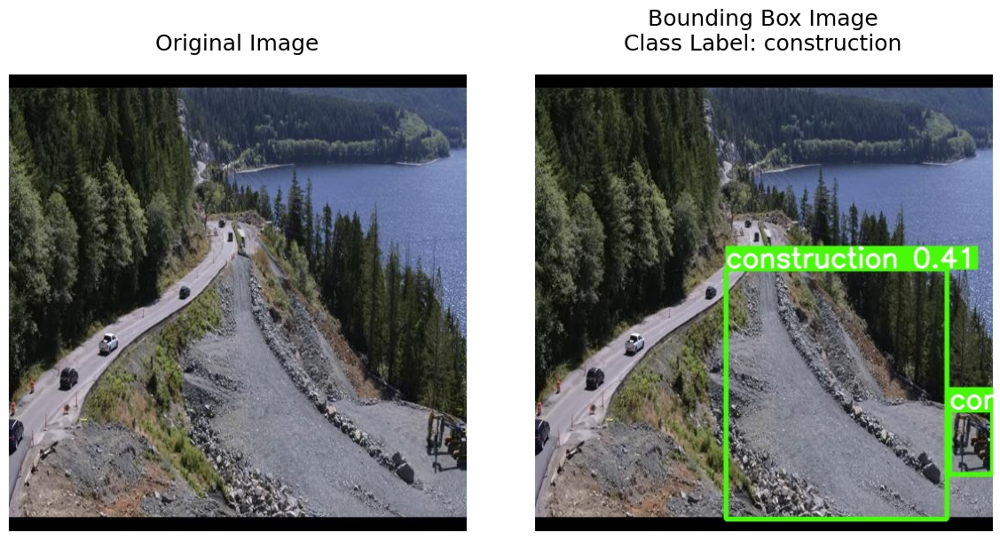

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import random
import os

# Load the CSV file with predicted labels
df = pd.read_csv('predicted_labels_with_names.csv')

# Shuffle the DataFrame to randomize selection
df_shuffled = df.sample(frac=1).reset_index(drop=True)

# Select one random row
random_row = df_shuffled.iloc[0]

# Get the image name and corresponding class label
image_name = random_row['Image Name']
class_label = random_row['Classified Label']
print(f'Class Label for {image_name}: {class_label}')

# Construct the full image paths
test_image_path = f'/kaggle/input/merged-yolo-uav-data/test/images/{image_name}'
bounding_box_image_path = f'runs/detect/predict/{image_name}'  # Assuming the bounding box image has the same name

# Load the original test image and bounding box image
try:
    original_img = mpimg.imread(test_image_path)
    bbox_img = mpimg.imread(bounding_box_image_path)
    
    # Create a figure with side-by-side images
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # Display original image
    axes[0].imshow(original_img)
    axes[0].set_title('Original Image', fontsize=18, pad=20)
    axes[0].axis('off')  # Hide axis
    
    # Display bounding box image
    axes[1].imshow(bbox_img)
    axes[1].set_title('Bounding Box Image\n' + f'Class Label: {class_label}', fontsize=18, pad=20)
    axes[1].axis('off')  # Hide axis
    
    plt.tight_layout()
    plt.show()

except FileNotFoundError as e:
    print(f'Error: {e}. Please check the path or file name.')


Class Label for construction5_0109_jpg.rf.0c8b40d6f18e5d1c32a7c6b7601e1f9b.jpg: construction
Class Label for construction2_0165_jpg.rf.3f374031436cee51a3c93abf6b3ab72a.jpg: construction
Class Label for img1220_jpg.rf.9f1d4018f780fabefffcfd4dc65550e0.jpg: garbage
Class Label for IMG_5774_JPG_jpg.rf.9d5cf476b2f6be1313c0cf61fd83eea4.jpg: crack
Class Label for img1394_jpg.rf.de2e89eee5eadb74299590d10fab4d3b.jpg: garbage
Class Label for CFD_060_jpg.rf.74af026e3f8831db80009acc0eec7058.jpg: crack
Class Label for frame9390_jpg.rf.e7373382df774b0bd646cddca614545a.jpg: crash
Class Label for zyro-image-17-_png_jpg.rf.256f2762570e16b7b8eeb5644ccc6911.jpg: crack
Class Label for 346_png_jpg.rf.9322272af681f1f3e60893398e9f088b.jpg: -
Class Label for 2_jpeg.rf.c5dd10516f26ee3dda56e11c1ca7e4f3.jpg: animal


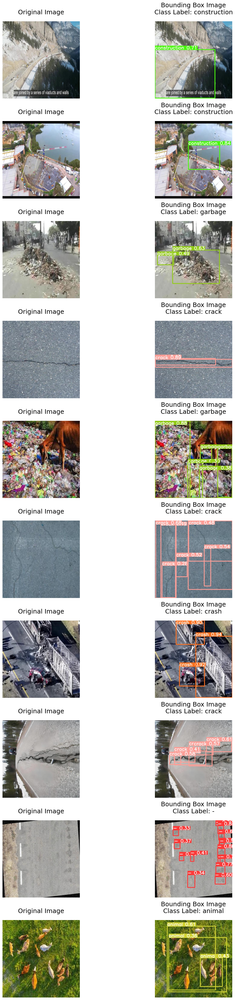

In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import random
import os

# Load the CSV file with predicted labels
df = pd.read_csv('predicted_labels_with_names.csv')

# Shuffle the DataFrame to randomize selection
df_shuffled = df.sample(frac=1).reset_index(drop=True)

# Select 10 random rows
random_rows = df_shuffled.iloc[:10]  # Get the first 10 rows after shuffling

# Create a figure with subplots for 10 images
fig, axes = plt.subplots(10, 2, figsize=(15, 40))  # Increased height for bigger images

for i, random_row in enumerate(random_rows.iterrows()):
    # Extract the image name and corresponding class label
    image_name = random_row[1]['Image Name']
    class_label = random_row[1]['Classified Label']
    print(f'Class Label for {image_name}: {class_label}')

    # Construct the full image paths
    test_image_path = f'/kaggle/input/merged-yolo-uav-data/test/images/{image_name}'
    bounding_box_image_path = f'runs/detect/predict/{image_name}'  # Assuming the bounding box image has the same name

    try:
        # Load the original test image and bounding box image
        original_img = mpimg.imread(test_image_path)
        bbox_img = mpimg.imread(bounding_box_image_path)

        # Display original image
        axes[i, 0].imshow(original_img)
        axes[i, 0].set_title('Original Image', fontsize=18, pad=20)
        axes[i, 0].axis('off')  # Hide axis
        
        # Display bounding box image
        axes[i, 1].imshow(bbox_img)
        axes[i, 1].set_title(f'Bounding Box Image\nClass Label: {class_label}', fontsize=18, pad=20)
        axes[i, 1].axis('off')  # Hide axis

    except FileNotFoundError as e:
        print(f'Error: {e}. Please check the path or file name for {image_name}.')

plt.tight_layout()
plt.show()


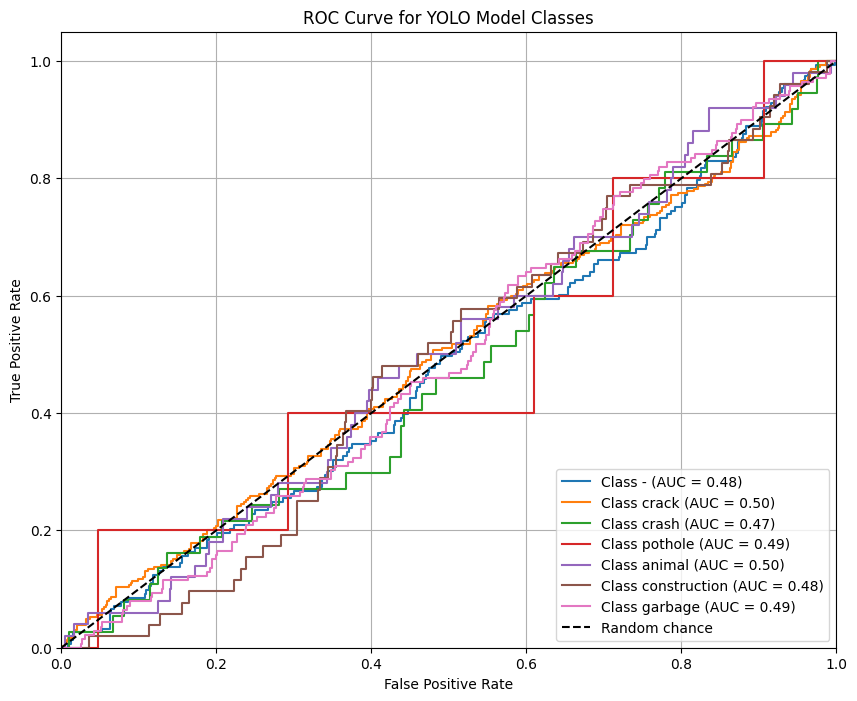

In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Load the predicted labels CSV
df = pd.read_csv('/kaggle/working/predicted_labels_with_names.csv')

# Create a mapping from class names to integers
class_mapping = {'-': 0, 'crack': 1, 'crash': 2, 'pothole': 3, 'animal': 4, 'construction': 5, 'garbage': 6}
num_classes = len(class_mapping)

# Binarize the labels
y_true = df['Classified Label'].map(class_mapping).values
y_pred_probs = df[['Classified Label']].copy()

# Assume you have predicted probabilities (replace this with your actual prediction probabilities)
# This should be in the format of (num_samples, num_classes)
# For demonstration, creating random probabilities
y_pred_probs = np.random.rand(len(df), num_classes)

# Binarize the output
y_true_bin = label_binarize(y_true, classes=list(range(num_classes)))

# Compute ROC curve and ROC AUC for each class
fpr = {}
tpr = {}
roc_auc = {}

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {list(class_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random chance')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for YOLO Model Classes')
plt.legend(loc='lower right')
plt.grid()
plt.show()
